In [1]:
# from google.colab import drive
# drive.mount('/content/gdrive')
# %cd '/content/gdrive/My Drive'

In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
from utils.agent import *
from utils.dataset import read_voc_dataset
import tqdm.notebook as tq
import pickle

_, val_loader2007 = read_voc_dataset(path="/kaggle/input/pascal-voc-2007/VOCtrainval_06-Nov-2007", year='2007')

In [4]:
datasets_per_class = sort_class_extract([val_loader2007])

  0%|          | 0/2510 [00:00<?, ?it/s]

In [6]:
torch.cuda.empty_cache()
results = {}
for i in classes:
    results[i] = []
model_name='resnet50'
for i in tq.tqdm(range(len(classes))):
    classe = classes[i]
    print("Class "+str(classe)+"...")
    agent = Agent(classe, load=True, model_name=model_name)
    res = agent.evaluate(datasets_per_class[classe])
    results[classe] = res

  0%|          | 0/5 [00:00<?, ?it/s]

Class cat...
Predicting boxes...
Computing recall and ap...
Final result : 
              0.4        0.5        0.6
ap      26.964413  14.068015   7.476707
recall  50.561798  37.078652  26.966292
Class cow...
Predicting boxes...
Computing recall and ap...
Final result : 
              0.4        0.5        0.6
ap      12.702343   7.339074   5.822765
recall  29.333333  21.333333  17.333333
Class dog...
Predicting boxes...
Computing recall and ap...
Final result : 
              0.4        0.5        0.6
ap      17.601680  12.641164   7.335286
recall  38.181818  30.000000  22.272727
Class bird...
Predicting boxes...
Computing recall and ap...
Final result : 
              0.4        0.5        0.6
ap       9.381684   5.150034   2.424969
recall  27.152318  18.543046  11.258278
Class car...
Predicting boxes...
Computing recall and ap...
Final result : 
              0.4        0.5        0.6
ap      12.041702   5.182441   3.078621
recall  30.362117  20.612813  14.484680


In [7]:
file_name = 'classes_results_' + model_name + '.pickle'
with open(file_name, 'wb') as handle:
    pickle.dump(results, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Visualize Random Class

Class: dog


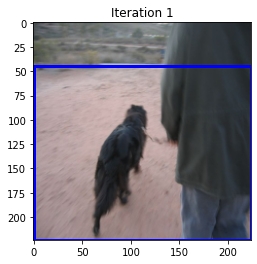

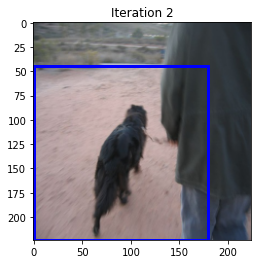

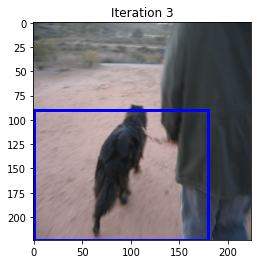

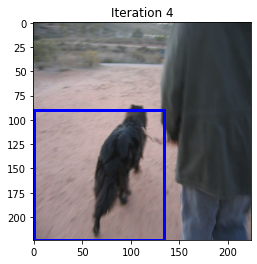

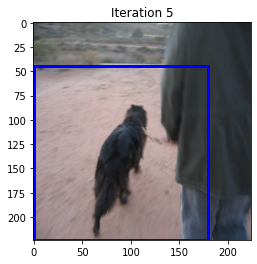

...

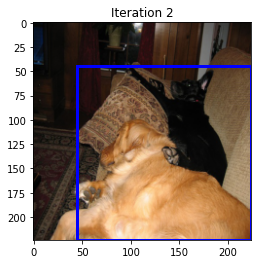

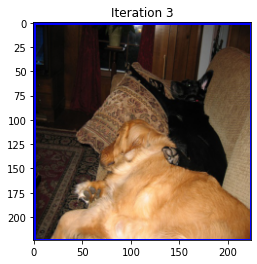

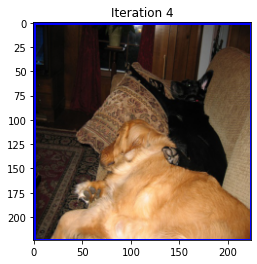

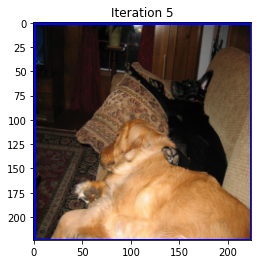

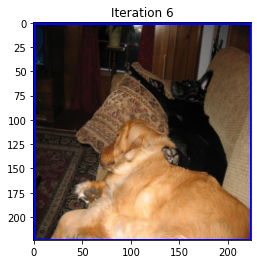

In [9]:
# import os
# os.makedirs('media', exist_ok=True)

from utils.tools import classes
classe = random.choice(classes)
index = random.choice(list(datasets_per_class[classe].keys()))
agent = Agent(classe, load=True, model_name=model_name)

print("Class: " + classe)
indices = np.random.choice(list(datasets_per_class[classe].keys()), 5)
for index in indices:
    image, gt_boxes = extract(index, datasets_per_class[classe])
    agent.predict_image(image, plot=True)